<a href="https://colab.research.google.com/github/CesarPortales/BootCamp/blob/master/Search_for_accommodation_in_Madrid_CP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Search for accommodation in Madrid
(by César Portales Alonso)

# 0.- Introduction

## Definition of the problem

Intentaremos resolver el problema usando ahora técnicas de Deep Learning

## Creation of file upload path

In [1]:
try:
    from google.colab import drive
    drive.mount('/content/drive/')
    ruta="/content/drive/My Drive/IBM/"
except:
    ruta="./data/"
print(ruta)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content/drive/My Drive/IBM/


# 1. Library load and useful functions

In [0]:
# mathematical functions, management of arrays and datasets
import math
import numpy as np

from scipy import stats
from scipy.stats import norm
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

#graphics management functions

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
%matplotlib inline

cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])

import seaborn as sns




In [0]:
# preprocessing and clustering functions
#from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import MinMaxScaler # to normailize data
from sklearn.cluster import KMeans # clustering
# NLP for extract Amenities
from sklearn.feature_extraction.text import CountVectorizer 
import string

In [4]:
# geolocation functions
!pip install geocoder
import geocoder # import geocoder
!pip install geopy
from geopy.geocoders import Nominatim
from geopy.distance import geodesic # To calculate distances to the Prado museum
from geopy.extra.rate_limiter import RateLimiter #necessary to pause between each search
import requests # library to handle Foursquare requests

# graph the maps
!pip install folium
import folium
geolocator = Nominatim(user_agent="mad_explorer")

# 1.- Data Analysis

## 1.1- Load data

In [5]:
#load airbnb file

ruta_datos_completo=ruta + "airbnb-extract-Madrid.csv"
df_Completo= pd.read_csv(ruta_datos_completo, sep=';', decimal='.')

print("File dimensions:",df_Completo.shape)

File dimensions: (13251, 10)


In [6]:
df_Completo.head()

,ID,Neighbourhood,Property Type,Room Type,Amenities,Price,Latitude,Longitude,URL,NAME
0,6478626,Retiro,Apartment,Private room,"TV,Wireless Internet,Kitchen,Heating,Essential...",28.0,40.406953,-3.670894,https://www.airbnb.com/rooms/6478626,Habitaci¢n con ba¤o .
1,4941335,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",58.0,40.425904,-3.681647,https://www.airbnb.com/rooms/4941335,C¢modo estudio en la calle Goya
2,12510355,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",70.0,40.428352,-3.687155,https://www.airbnb.com/rooms/12510355,Studio & Terrace - Barrio Salamanca
3,4756811,Salamanca,Apartment,Private room,"Internet,Wireless Internet,Kitchen,Doorman,Ele...",26.0,40.427454,-3.685763,https://www.airbnb.com/rooms/4756811,Cute single room -private bathroom
4,15332216,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",70.0,40.428671,-3.685423,https://www.airbnb.com/rooms/15332216,Deluxe Apartment in Barrio Salamanca (next to IE)


We select only complete rented apartments

In [7]:
print("Dataset size:", df_Completo.shape)
df0 = df_Completo.drop(df_Completo[df_Completo['Property Type'] != "Apartment"].index)
df = df0.drop(df0[df0['Room Type'] != "Entire home/apt"].index)

df.reset_index(drop=True, inplace=True)
print("Dimensions of the dataset once the data for Madrid are selected are:", df.shape)

Dataset size: (13251, 10)
Dimensions of the dataset once the data for Madrid are selected are: (7013, 10)


In [8]:
df.head()

,ID,Neighbourhood,Property Type,Room Type,Amenities,Price,Latitude,Longitude,URL,NAME
0,4941335,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",58.0,40.425904,-3.681647,https://www.airbnb.com/rooms/4941335,C¢modo estudio en la calle Goya
1,12510355,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",70.0,40.428352,-3.687155,https://www.airbnb.com/rooms/12510355,Studio & Terrace - Barrio Salamanca
2,15332216,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",70.0,40.428671,-3.685423,https://www.airbnb.com/rooms/15332216,Deluxe Apartment in Barrio Salamanca (next to IE)
3,3116679,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",260.0,40.425606,-3.683705,https://www.airbnb.com/rooms/3116679,Elegant & central luxury 3 bedroom apartment
4,3962279,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",60.0,40.426550,-3.676096,https://www.airbnb.com/rooms/3962279,Beautiful apartment in the center


**We calculate the coordinates of the Prado museum**

In [9]:

address = 'Prado Museum,Madrid, Spain'

#geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Prado Museum are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Prado Museum are 40.41379945, -3.692005340690069.


Function to calculate distances to the Prado museum

In [0]:

prado_museum=(latitude,longitude)
def calc_distance(lat,long):
    dir=(lat,long)
    dist=(geodesic(prado_museum, dir).kilometers)
    return dist

Distances to the Prado museum are added to the dataframe

In [11]:

df['Dist_Museos']=df.apply(lambda row:calc_distance(row.Latitude, row.Longitude),axis=1)
df.head()

,ID,Neighbourhood,Property Type,Room Type,Amenities,Price,Latitude,Longitude,URL,NAME,Dist_Museos
0,4941335,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",58.0,40.425904,-3.681647,https://www.airbnb.com/rooms/4941335,C¢modo estudio en la calle Goya,1.606046
1,12510355,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",70.0,40.428352,-3.687155,https://www.airbnb.com/rooms/12510355,Studio & Terrace - Barrio Salamanca,1.667554
2,15332216,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",70.0,40.428671,-3.685423,https://www.airbnb.com/rooms/15332216,Deluxe Apartment in Barrio Salamanca (next to IE),1.743295
3,3116679,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",260.0,40.425606,-3.683705,https://www.airbnb.com/rooms/3116679,Elegant & central luxury 3 bedroom apartment,1.488292
4,3962279,Salamanca,Apartment,Entire home/apt,"TV,Internet,Wireless Internet,Air conditioning...",60.0,40.426550,-3.676096,https://www.airbnb.com/rooms/3962279,Beautiful apartment in the center,1.956402


In [12]:
df['Dist_Museos'].describe()

count    7013.000000
mean        1.985098
std         1.567869
min         0.076503
25%         1.097420
50%         1.527685
75%         2.249133
max        12.014815
Name: Dist_Museos, dtype: float64

Distances greater than 1.5 kms are eliminated

In [13]:
print(df.shape)
df = df.drop(df[df['Dist_Museos']>=1.5].index)
df = df.reset_index(drop=True)
df.shape

(7013, 11)


(3404, 11)

## 1.2.- Previous exploration

In [14]:
#We changed the configuration of pandas so that when we execute instructions that show "long listings" the full result is displayed
pd.set_option ('display.max_rows', None) # to show all rows

pd.set_option('display.max_columns', None) # to show all columns

#We visualize the available fields with their corresponding data types
df.dtypes

ID                 int64
Neighbourhood     object
Property Type     object
Room Type         object
Amenities         object
Price            float64
Latitude         float64
Longitude        float64
URL               object
NAME              object
Dist_Museos      float64
dtype: object

In [15]:
df.columns

Index(['ID', 'Neighbourhood', 'Property Type', 'Room Type', 'Amenities',
       'Price', 'Latitude', 'Longitude', 'URL', 'NAME', 'Dist_Museos'],
      dtype='object')

We eliminate the excess columns

In [16]:
# The Id does not provide information, and 'Room Type' and 'Property type' contain the same information
columns_to_drop=([
    'ID', 'Property Type', 'Room Type'])
df.drop(df[columns_to_drop],axis=1,inplace=True)

df.head()

,Neighbourhood,Amenities,Price,Latitude,Longitude,URL,NAME,Dist_Museos
0,Salamanca,"TV,Internet,Wireless Internet,Air conditioning...",260.0,40.425606,-3.683705,https://www.airbnb.com/rooms/3116679,Elegant & central luxury 3 bedroom apartment,1.488292
1,Chamberí,"Internet,Wireless Internet,Air conditioning,Ki...",39.0,40.426181,-3.691686,https://www.airbnb.com/rooms/15261457,Madrid Best Location. Wifi,1.375093
2,Arganzuela,"Internet,Wireless Internet,Kitchen,Elevator in...",45.0,40.406331,-3.693788,https://www.airbnb.com/rooms/5257204,Nice apartment in Madrid downtown,0.843037
3,Arganzuela,"TV,Internet,Wireless Internet,Air conditioning...",72.0,40.403312,-3.692192,https://www.airbnb.com/rooms/13892731,Dise¤o en Atocha,1.164656
4,Arganzuela,"TV,Cable TV,Internet,Wireless Internet,Air con...",75.0,40.401909,-3.690974,https://www.airbnb.com/rooms/1740331,Central 2 Madrid Atocha Museum Mile,1.323234


### NaN values

We check NaN values

In [17]:
df.isnull().sum()

Neighbourhood    0
Amenities        8
Price            1
Latitude         0
Longitude        0
URL              0
NAME             0
Dist_Museos      0
dtype: int64

Since there are few records, we will delete the rows without prices. Instead, we will keep the amenities, because it is reasonable that there are apartments that do not provide any kind of amentie. Later we will manage the treatment of nulls in this field.

In [18]:
print("Size before removing empty prices:",df.shape)
df.drop(df[df['Price'].isnull()].index, inplace = True)

print("Size after removing empty prices:",df.shape)

Size before removing empty prices: (3404, 8)
Size after removing empty prices: (3403, 8)


### Analysis of the variable 'Price'

We are going to analyze the variable 'Price' and see if it has outliers. We check it using a boxplot

count    3403.000000
mean       89.532471
std        58.482222
min        12.000000
25%        58.000000
50%        75.000000
75%       100.000000
max       600.000000
Name: Price, dtype: float64


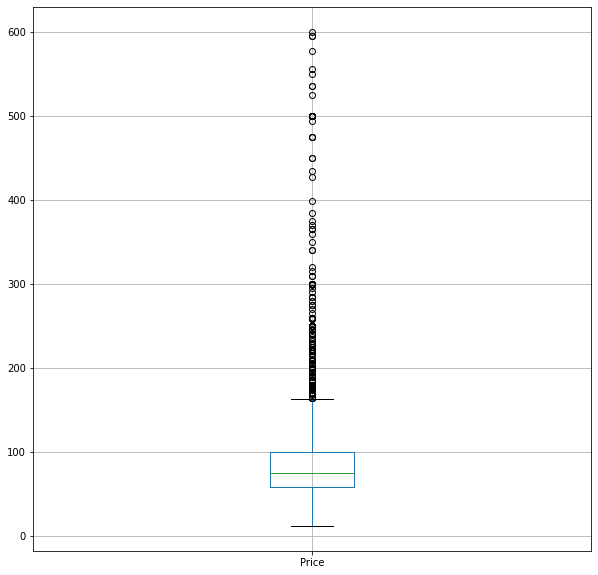

In [19]:
print(df['Price'].describe())
df.plot(kind='box',y='Price',grid=True,figsize=(10 ,10))

plt.show()

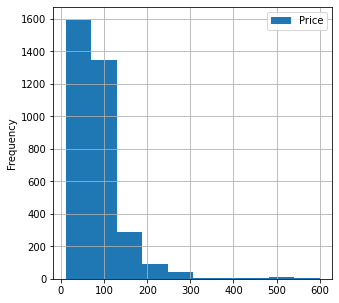

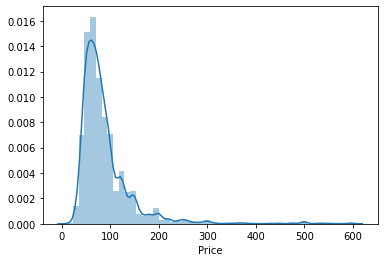

In [20]:
# We can also see it in a histogram
df.plot(kind='hist',y='Price',grid=True,figsize=(5 ,5))

plt.show()
sns.distplot(df['Price']);

At first glance it is seen that there is a standard deviation from the normal distribution, a positive symmetry and the presence of some peaks is observed.

We see that outliers are considered approximately from 180. But it is seen that until approximately 250 there is a large group of values.

We check how many values are above 250 price

In [21]:
df=df[df['Price']<=250]
print("Number of records after removing prices above 250:",df.shape)

Number of records after removing prices above 250: (3334, 8)


In [22]:
# Although it was clear on the charts, we made sure there are no prices equal to zero
print(f"Records with zero price: {len(df[df['Price'] == 0])}")

Records with zero price: 0


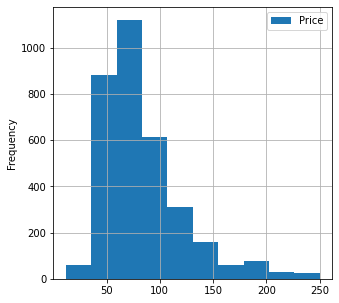

In [23]:
df.plot(kind='hist',y='Price',grid=True,figsize=(5 ,5))

plt.show()

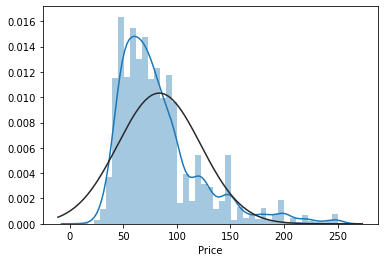

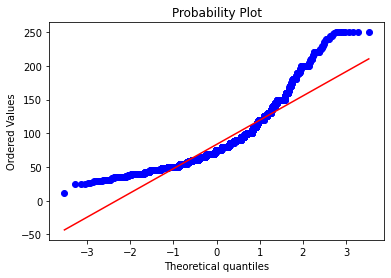

In [24]:
# Histogram and normal probability graph:

sns.distplot(df['Price'], fit = norm);
fig = plt.figure()
res = stats.probplot(df['Price'], plot = plt)

In [25]:
# Asymmetry and kurtosis:

print("Asimetría: %f" % df['Price'].skew())
print("Kurtosis: %f" % df['Price'].kurt())



Asimetría: 1.582267
Kurtosis: 2.882703


From these graphs it follows that 'Price' does not make up a normal distribution. It shows peaks, positive skewness and does not follow the diagonal line; although a simple data transformation could solve the problem.

According to some authors, this could be solved by applying a logarithmic function (both to the train and test data), but we understand that this would mean falsifying the data they have provided.

In [26]:
df['Price'].describe()

count    3334.000000
mean       83.565687
std        38.630482
min        12.000000
25%        57.000000
50%        75.000000
75%        99.000000
max       250.000000
Name: Price, dtype: float64

In [27]:
df.head()

,Neighbourhood,Amenities,Price,Latitude,Longitude,URL,NAME,Dist_Museos
1,Chamberí,"Internet,Wireless Internet,Air conditioning,Ki...",39.0,40.426181,-3.691686,https://www.airbnb.com/rooms/15261457,Madrid Best Location. Wifi,1.375093
2,Arganzuela,"Internet,Wireless Internet,Kitchen,Elevator in...",45.0,40.406331,-3.693788,https://www.airbnb.com/rooms/5257204,Nice apartment in Madrid downtown,0.843037
3,Arganzuela,"TV,Internet,Wireless Internet,Air conditioning...",72.0,40.403312,-3.692192,https://www.airbnb.com/rooms/13892731,Dise¤o en Atocha,1.164656
4,Arganzuela,"TV,Cable TV,Internet,Wireless Internet,Air con...",75.0,40.401909,-3.690974,https://www.airbnb.com/rooms/1740331,Central 2 Madrid Atocha Museum Mile,1.323234
5,Centro,"TV,Internet,Wireless Internet,Air conditioning...",85.0,40.417528,-3.701759,https://www.airbnb.com/rooms/16399219,Unbeatable Location - Sol- 1 Bedr/1Bathr -4 pe...,0.925563


We will see more clearly what the correlations are like by visualizing their numerical values.

In [28]:
corr = df.corr()
corr[['Price']].sort_values(by = 'Price',ascending = False)\
.style.background_gradient()

,Price
Price,1.000000
Latitude,0.194602
Longitude,0.033447
Dist_Museos,0.032830


We can see that there are no particularly strong correlations in relation to the variable 'Price' (close to one in absolute value). Let's see graphically how the correlations would look with some of the attributes

In [29]:
cols=np.asarray(df.columns)
cols

array(['Neighbourhood', 'Amenities', 'Price', 'Latitude', 'Longitude',
       'URL', 'NAME', 'Dist_Museos'], dtype=object)

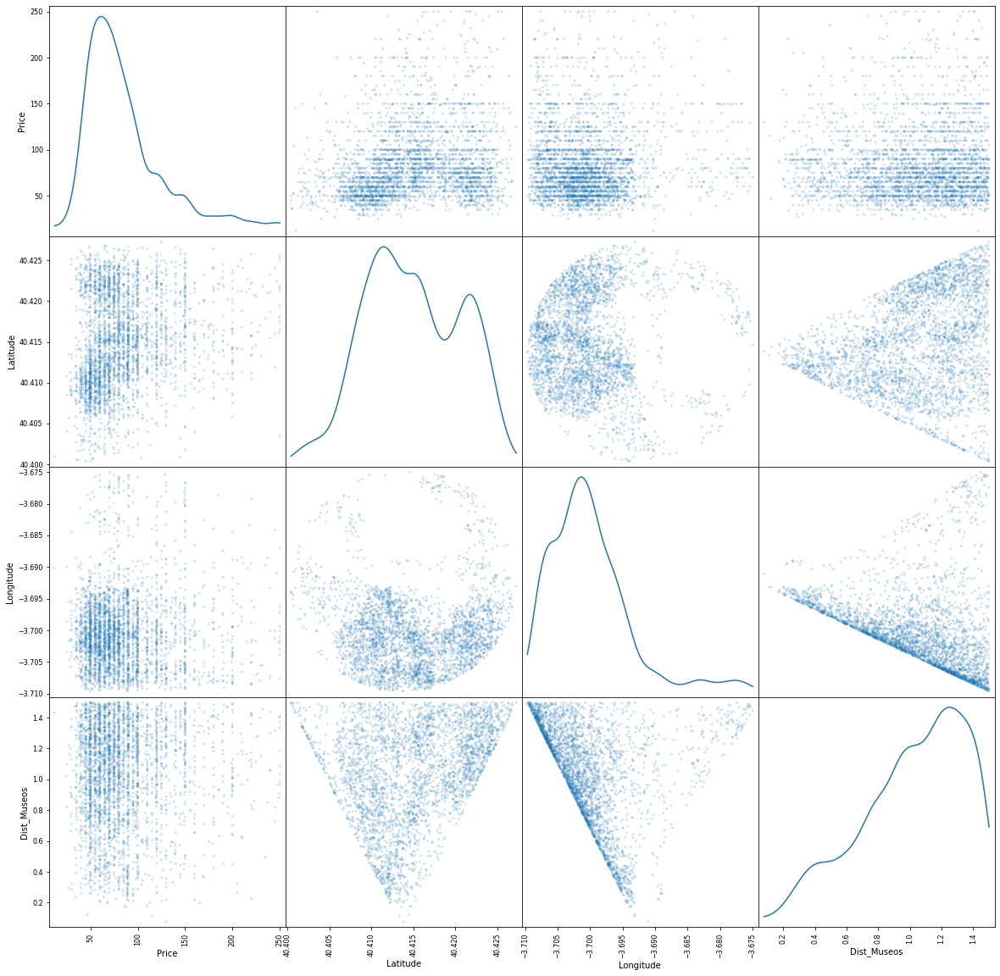

In [30]:
# We make a scatter_plot to get an idea of how some of the remaining variables are related

pd.plotting.scatter_matrix(df[cols], alpha=0.2, figsize=(20, 20), diagonal = 'kde')
plt.show()

In [31]:
#Check what number fields are left
df_num=df.select_dtypes(exclude=['object'])
df_num.head()

,Price,Latitude,Longitude,Dist_Museos
1,39.0,40.426181,-3.691686,1.375093
2,45.0,40.406331,-3.693788,0.843037
3,72.0,40.403312,-3.692192,1.164656
4,75.0,40.401909,-3.690974,1.323234
5,85.0,40.417528,-3.701759,0.925563



## Categorical data

In [32]:
print("The categorical data in the dataset are:")
df.select_dtypes(include=['object']).columns

The categorical data in the dataset are:


Index(['Neighbourhood', 'Amenities', 'URL', 'NAME'], dtype='object')

In [33]:
categ=df.select_dtypes(include=['object']).columns.tolist()
categ

['Neighbourhood', 'Amenities', 'URL', 'NAME']

### Working with amenities

In [34]:
df_categ= df.select_dtypes(include=['object'])
df_categ.head()

,Neighbourhood,Amenities,URL,NAME
1,Chamberí,"Internet,Wireless Internet,Air conditioning,Ki...",https://www.airbnb.com/rooms/15261457,Madrid Best Location. Wifi
2,Arganzuela,"Internet,Wireless Internet,Kitchen,Elevator in...",https://www.airbnb.com/rooms/5257204,Nice apartment in Madrid downtown
3,Arganzuela,"TV,Internet,Wireless Internet,Air conditioning...",https://www.airbnb.com/rooms/13892731,Dise¤o en Atocha
4,Arganzuela,"TV,Cable TV,Internet,Wireless Internet,Air con...",https://www.airbnb.com/rooms/1740331,Central 2 Madrid Atocha Museum Mile
5,Centro,"TV,Internet,Wireless Internet,Air conditioning...",https://www.airbnb.com/rooms/16399219,Unbeatable Location - Sol- 1 Bedr/1Bathr -4 pe...


The 'Amenities' field does have important information, and that we will study with basic NLP techniques.

A very advanced study will not be required because, as we will see below, the information is very little varied (it looks like it has been selected from some type of menu). So in principle we will use sklearn's 'Feature_extraction', which is efficient and easy to use.

We will create a column in the dataset for each of the elements of the attribute, and then we will be left with only the columns that interest us, saving them with values of one or zero.

In [0]:
# We load necessary bookstore
import string

# We establish the list of punctuation characters that will not be analyzed
punctuation = set(string.punctuation)

# We define a function to 'tokenize'. The values we want to extract are separated by commas,
# so let's set this character as a separator.
# For pure aesthetics we will change the text to capital instead of lowercase (CountVectorizer default value)
# As the data is so homogeneous, we will see that there is no need to control more (tildes, etc.)

def tokenize(sentence):
    tokens = []
    for token in sentence.split(','):
        new_token = []
        for character in token:
            if character not in punctuation:
                new_token.append(character.capitalize())
        if new_token:
            tokens.append("".join(new_token))
    return tokens

In [0]:
# feature_extracton gives error if it finds Nan values, so we will fill it with any value (for example, 'Z')
# Then we will delete the new column that is going to be generated, so it does not matter what value is set
df_categ['Amenities'].fillna('Z',inplace= True)

We load CountVectorizer, which will perform the entire data extraction process and create a new field in the dataset for every value it finds

In [0]:
# We configure CountVectporizer with the parameters of the tokenize function that we have created
amenities_vectorizer = CountVectorizer(
    tokenizer = tokenize,
    binary=True # It will only create one or zero values instead of counting all repetitions
)

In [0]:
# We make fit
amenities_vectorizer.fit(df_categ['Amenities'])

# the toarray () is essential for the data to be included in an array and manageable
vectors = amenities_vectorizer.transform(df_categ['Amenities']).toarray()

In [39]:
print(f'A total of {vectors.shape[1]} fields have been generated.')

A total of 67 fields have been generated.


We will save all the information obtained in a new dataset

In [40]:
# We visualize the generated columns and create a dataframe that saves the results
# The dataframe that is generated keeps the rows in the same order, but saves the fields in alphabetical order
# That is why it is essential to use 'sorted'
headers = sorted(amenities_vectorizer.vocabulary_.keys())

print("Columns generated from the values of 'Amenities' \n")
print(np.transpose(headers))

# We save headers and data in a dataframe
df_am=pd.DataFrame(vectors, columns=headers)
print(f"\nA {df_am.shape[0]} rows and {df_am.shape[1]} columns dataset has been generated.\n")
df_am.head(10)

Columns generated from the values of 'Amenities' 

['24HOUR CHECKIN' 'AIR CONDITIONING' 'BABY BATH'
 'BABYSITTER RECOMMENDATIONS' 'BATHTUB' 'BREAKFAST'
 'BUZZERWIRELESS INTERCOM' 'CABLE TV' 'CARBON MONOXIDE DETECTOR' 'CATS'
 'CHILDRENS BOOKS AND TOYS' 'CHILDRENS DINNERWARE' 'CRIB' 'DOGS' 'DOORMAN'
 'DOORMAN ENTRY' 'DRYER' 'ELEVATOR IN BUILDING' 'ESSENTIALS'
 'FAMILYKID FRIENDLY' 'FIRE EXTINGUISHER' 'FIRST AID KIT'
 'FREE PARKING ON PREMISES' 'FREE PARKING ON STREET' 'GAME CONSOLE' 'GYM'
 'HAIR DRYER' 'HANGERS' 'HEATING' 'HIGH CHAIR' 'HOT TUB'
 'INDOOR FIREPLACE' 'INTERNET' 'IRON' 'KEYPAD' 'KITCHEN'
 'LAPTOP FRIENDLY WORKSPACE' 'LOCK ON BEDROOM DOOR' 'LOCKBOX' 'OTHER PETS'
 'OUTLET COVERS' 'PACK N PLAYTRAVEL CRIB' 'PAID PARKING OFF PREMISES'
 'PETS ALLOWED' 'PETS LIVE ON THIS PROPERTY' 'POOL' 'PRIVATE ENTRANCE'
 'PRIVATE LIVING ROOM' 'ROOMDARKENING SHADES' 'SAFETY CARD' 'SELF CHECKIN'
 'SHAMPOO' 'SMARTLOCK' 'SMOKE DETECTOR' 'SMOKING ALLOWED' 'STAIR GATES'
 'SUITABLE FOR EVENTS' 'TABLE C

,24HOUR CHECKIN,AIR CONDITIONING,BABY BATH,BABYSITTER RECOMMENDATIONS,BATHTUB,BREAKFAST,BUZZERWIRELESS INTERCOM,CABLE TV,CARBON MONOXIDE DETECTOR,CATS,CHILDRENS BOOKS AND TOYS,CHILDRENS DINNERWARE,CRIB,DOGS,DOORMAN,DOORMAN ENTRY,DRYER,ELEVATOR IN BUILDING,ESSENTIALS,FAMILYKID FRIENDLY,FIRE EXTINGUISHER,FIRST AID KIT,FREE PARKING ON PREMISES,FREE PARKING ON STREET,GAME CONSOLE,GYM,HAIR DRYER,HANGERS,HEATING,HIGH CHAIR,HOT TUB,INDOOR FIREPLACE,INTERNET,IRON,KEYPAD,KITCHEN,LAPTOP FRIENDLY WORKSPACE,LOCK ON BEDROOM DOOR,LOCKBOX,OTHER PETS,OUTLET COVERS,PACK N PLAYTRAVEL CRIB,PAID PARKING OFF PREMISES,PETS ALLOWED,PETS LIVE ON THIS PROPERTY,POOL,PRIVATE ENTRANCE,PRIVATE LIVING ROOM,ROOMDARKENING SHADES,SAFETY CARD,SELF CHECKIN,SHAMPOO,SMARTLOCK,SMOKE DETECTOR,SMOKING ALLOWED,STAIR GATES,SUITABLE FOR EVENTS,TABLE CORNER GUARDS,TRANSLATION MISSING ENHOSTINGAMENITY49,TRANSLATION MISSING ENHOSTINGAMENITY50,TV,WASHER,WASHER DRYER,WHEELCHAIR ACCESSIBLE,WINDOW GUARDS,WIRELESS INTERNET,Z
0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0
1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0
2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0
3,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0
4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0
5,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0
7,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0
8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0
9,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0


We are going to eliminate the fields that the client has not asked for, and regarding what he has asked us, we will make combinations of values. For example, if we are interested in information about whether or not there is internet access, we will combine fields such as "Internet" and "Wireless Internet", or in the case of whether the home is child-friendly, we will combine information about whether it has games or books to children, if you have a high chair, etc.

In [0]:
df_am['Pets'] =(df_am['CATS'].astype(bool)) | (df_am['DOGS'].astype(bool)) | (df_am['OTHER PETS'].astype(bool)) | (df_am['PETS ALLOWED'].astype(bool)) |(df_am['PETS LIVE ON THIS PROPERTY'].astype(bool)) 
df_am_to_drop =['CATS','DOGS','OTHER PETS','PETS ALLOWED','PETS LIVE ON THIS PROPERTY']
df_am['InternetAccess'] =(df_am['INTERNET'].astype(bool)) | (df_am['WIRELESS INTERNET'].astype(bool)) 
df_am_to_drop.extend(['INTERNET','WIRELESS INTERNET'])
df_am['TempControl'] = (df_am['AIR CONDITIONING'].astype(bool)) | (df_am['HEATING'].astype(bool))
df_am_to_drop.extend(['AIR CONDITIONING','HEATING'])
df_am['KidsFriendly'] = (df_am['BABY BATH'].astype(bool)) | (df_am['BABYSITTER RECOMMENDATIONS'].astype(bool)) | (df_am['CHILDRENS BOOKS AND TOYS'].astype(bool)) |(df_am['CHILDRENS DINNERWARE'].astype(bool)) | (df_am['FAMILYKID FRIENDLY'].astype(bool)) | (df_am['CRIB'].astype(bool)) | (df_am['HIGH CHAIR'].astype(bool)) | (df_am['TABLE CORNER GUARDS'].astype(bool))   
df_am_to_drop.extend(['BABY BATH','BABYSITTER RECOMMENDATIONS','CRIB','CHILDRENS BOOKS AND TOYS','CHILDRENS DINNERWARE','FAMILYKID FRIENDLY'])
df_am_to_drop.extend(['24HOUR CHECKIN', 'BATHTUB', 'BREAKFAST','BUZZERWIRELESS INTERCOM', 'CABLE TV', 'CARBON MONOXIDE DETECTOR'])
df_am_to_drop.extend(['DOORMAN', 'DOORMAN ENTRY', 'DRYER', 'ELEVATOR IN BUILDING', 'FIRE EXTINGUISHER','FIRST AID KIT'])
df_am_to_drop.extend([ 'FREE PARKING ON PREMISES', 'FREE PARKING ON STREET', 'GAME CONSOLE', 'GYM','HIGH CHAIR'])
df_am_to_drop.extend(['HAIR DRYER', 'HANGERS', 'HOT TUB', 'INDOOR FIREPLACE', 'IRON' ,'KEYPAD'])
df_am_to_drop.extend([ 'LAPTOP FRIENDLY WORKSPACE', 'LOCK ON BEDROOM DOOR','LOCKBOX', 'PACK N PLAYTRAVEL CRIB'])
df_am_to_drop.extend([ 'PAID PARKING OFF PREMISES', 'PETS ALLOWED', 'PETS LIVE ON THIS PROPERTY', 'POOL', 'PRIVATE ENTRANCE'])
df_am_to_drop.extend(['PRIVATE LIVING ROOM', 'ROOMDARKENING SHADES' ,'SAFETY CARD', 'SELF CHECKIN'])
df_am_to_drop.extend(['SHAMPOO', 'SMARTLOCK', 'SMOKE DETECTOR' ,'STAIR GATES', 'SUITABLE FOR EVENTS'])
df_am_to_drop.extend([ 'TRANSLATION MISSING ENHOSTINGAMENITY49', 'TRANSLATION MISSING ENHOSTINGAMENITY50'])
df_am_to_drop.extend([ 'OUTLET COVERS', 'TABLE CORNER GUARDS'])

df_am_to_drop.extend(['TV' ,'WASHER' ,'WASHER  DRYER', 'WINDOW GUARDS' , 'Z'])

In [0]:
df_am['Pets'] = df_am['Pets'].apply(lambda x: 1 if(x==True) else 0)
df_am['InternetAccess'] = df_am['InternetAccess'].apply(lambda x: 1 if(x==True) else 0)
df_am['TempControl'] = df_am['TempControl'].apply(lambda x: 1 if(x==True) else 0)
df_am['KidsFriendly'] = df_am['KidsFriendly'].apply(lambda x: 1 if(x==True) else 0)

In [0]:
df_am.drop(df_am_to_drop,axis=1,inplace=True)

In [44]:
print("The dimensions of the dataset resulting from the extraction are:",df_am.shape)

The dimensions of the dataset resulting from the extraction are: (3334, 8)


In [45]:
df_am.head()

,ESSENTIALS,KITCHEN,SMOKING ALLOWED,WHEELCHAIR ACCESSIBLE,Pets,InternetAccess,TempControl,KidsFriendly
0,1,1,1,0,0,1,1,1
1,1,1,0,0,0,1,1,0
2,1,1,1,0,1,1,1,1
3,1,1,0,0,0,1,1,1
4,1,1,0,0,0,1,1,1


We analyze the distribution of the data obtained

In [46]:
#We make sure that there are no null values
df_am.isnull().any()

ESSENTIALS               False
KITCHEN                  False
SMOKING ALLOWED          False
WHEELCHAIR ACCESSIBLE    False
Pets                     False
InternetAccess           False
TempControl              False
KidsFriendly             False
dtype: bool

In [47]:
df_am.describe()

,ESSENTIALS,KITCHEN,SMOKING ALLOWED,WHEELCHAIR ACCESSIBLE,Pets,InternetAccess,TempControl,KidsFriendly
count,3334.000000,3334.000000,3334.000000,3334.000000,3334.000000,3334.000000,3334.000000,3334.000000
mean,0.918116,0.981404,0.190762,0.080984,0.181464,0.972406,0.967307,0.786143
std,0.274228,0.135115,0.392961,0.272851,0.385460,0.163832,0.177860,0.410089
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
50%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
75%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [48]:
cols=df_am.columns.tolist()

rows=df_am.shape[0]
for col in cols:
    ones=df_am[df_am[col] ==1].shape[0]
    zeros=rows-ones
    perc_ones=(ones/rows)*100
  
    print('For the column {} the distribution of values is:\n -ones:{}\n -zeros:{}\n -Percentaje ones: {}\n'.format(col,ones,zeros,perc_ones))
    

For the column ESSENTIALS the distribution of values is:
 -ones:3061
 -zeros:273
 -Percentaje ones: 91.81163767246551

For the column KITCHEN the distribution of values is:
 -ones:3272
 -zeros:62
 -Percentaje ones: 98.14037192561487

For the column SMOKING ALLOWED the distribution of values is:
 -ones:636
 -zeros:2698
 -Percentaje ones: 19.07618476304739

For the column WHEELCHAIR ACCESSIBLE the distribution of values is:
 -ones:270
 -zeros:3064
 -Percentaje ones: 8.098380323935213

For the column Pets the distribution of values is:
 -ones:605
 -zeros:2729
 -Percentaje ones: 18.14637072585483

For the column InternetAccess the distribution of values is:
 -ones:3242
 -zeros:92
 -Percentaje ones: 97.24055188962207

For the column TempControl the distribution of values is:
 -ones:3225
 -zeros:109
 -Percentaje ones: 96.73065386922616

For the column KidsFriendly the distribution of values is:
 -ones:2621
 -zeros:713
 -Percentaje ones: 78.61427714457109



We see that the distribution of the data in general occurs unequally

In [0]:
#Remove the 'Amenities' field, since we have already extracted the data that interests us

df_categ.drop(['Amenities'],axis=1,inplace=True)

### Rest of categorical data

In [50]:
df_categ.reset_index(drop=True, inplace=True)
print('Dimensions of the categorical data dataframe:',df_categ.shape)


Dimensions of the categorical data dataframe: (3334, 3)


In [51]:
df_categ.columns.tolist()

['Neighbourhood', 'URL', 'NAME']

**We will not analyze neither URL nor Name, because we will only use them to show them on the map**

We check the distribution of the 'Neighborhoods'.

In [52]:
df_categ['Neighbourhood'].value_counts()

Centro        3003
Arganzuela     131
Retiro         115
Salamanca       79
Chamberí         6
Name: Neighbourhood, dtype: int64

We create a new dataframe with the 'Neighborhoods' and with an 'Address' field to find the coordinates of each of them.

In [53]:
df_neigh=pd.DataFrame(df_categ['Neighbourhood'].unique())
df_neigh['Address']=df_neigh[0] +',Madrid,Spain'
df_neigh

,0,Address
0,Chamberí,"Chamberí,Madrid,Spain"
1,Arganzuela,"Arganzuela,Madrid,Spain"
2,Centro,"Centro,Madrid,Spain"
3,Retiro,"Retiro,Madrid,Spain"
4,Salamanca,"Salamanca,Madrid,Spain"


**This leads us to believe that when we do clustering, the neighborhood will not influence much, as the vast majority of the accommodations will be in the Centro district.**

In [54]:

geolocator = Nominatim(user_agent="ny_explorer")

def get_geo(address):
    print(address)
    geolocator = Nominatim(user_agent="ny_explorer")
    location = RateLimiter(geolocator.geocode, min_delay_seconds=5,max_retries=4)
    
    print(type(location))
    return location
from geopy.geocoders import Nominatim
#geolocator = Nominatim(user_agent="ny_explorer")

from geopy.extra.rate_limiter import RateLimiter
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
df_neigh['loc'] = df_neigh['Address'].apply(geocode)
df_neigh

,0,Address,loc
0,Chamberí,"Chamberí,Madrid,Spain","(Chamberí, Madrid, Área metropolitana de Madri..."
1,Arganzuela,"Arganzuela,Madrid,Spain","(Arganzuela, Madrid, Área metropolitana de Mad..."
2,Centro,"Centro,Madrid,Spain","(Centro, Madrid, Área metropolitana de Madrid ..."
3,Retiro,"Retiro,Madrid,Spain","(Retiro, Madrid, Área metropolitana de Madrid ..."
4,Salamanca,"Salamanca,Madrid,Spain","(Salamanca, Madrid, Área metropolitana de Madr..."


In [55]:
df.columns

Index(['Neighbourhood', 'Amenities', 'Price', 'Latitude', 'Longitude', 'URL',
       'NAME', 'Dist_Museos'],
      dtype='object')

In [56]:
# create map of Madrid nearest Padro museum using latitude and longitude values
map_madrid = folium.Map(location=[latitude, longitude], zoom_start=16)

# add markers to map
for lat, lng, neighbourhood,index,price,name,url in zip(df['Latitude'], df['Longitude'], df['Neighbourhood'],df.index,df['Price'],df['NAME'],df['URL']):
    label = 'Id: {}\nNeighbourhoods:{}\nName: {}\nURL: {}\nPrice:{}'.format(index,neighbourhood,name,url,price)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_madrid)  
    
map_madrid

Since the K-means algorithm does not work with categorical data, we will apply one-hot encoding to this field.

In [57]:
df_categ_0 = pd.get_dummies(df_categ['Neighbourhood'])
df_categ_0.head()


,Arganzuela,Centro,Chamberí,Retiro,Salamanca
0,0,0,1,0,0
1,1,0,0,0,0
2,1,0,0,0,0
3,1,0,0,0,0
4,0,1,0,0,0


We put together the partial datasets to obtain the final dataset with which we are going to work

In [58]:
df_final = pd.concat([df_num, df_categ_0,df_am,], axis=1, join='inner')

df_final.head()

,Price,Latitude,Longitude,Dist_Museos,Arganzuela,Centro,Chamberí,Retiro,Salamanca,ESSENTIALS,KITCHEN,SMOKING ALLOWED,WHEELCHAIR ACCESSIBLE,Pets,InternetAccess,TempControl,KidsFriendly
1,39.0,40.426181,-3.691686,1.375093,1,0,0,0,0,1,1,0,0,0,1,1,0
2,45.0,40.406331,-3.693788,0.843037,1,0,0,0,0,1,1,1,0,1,1,1,1
3,72.0,40.403312,-3.692192,1.164656,1,0,0,0,0,1,1,0,0,0,1,1,1
4,75.0,40.401909,-3.690974,1.323234,0,1,0,0,0,1,1,0,0,0,1,1,1
5,85.0,40.417528,-3.701759,0.925563,0,1,0,0,0,0,1,1,0,1,1,1,1


We create another dataframe that we will use to paint the map (we will use name and URL for the labels)

In [59]:
df_madrid = pd.concat([df_categ,df_num], axis=1, join='inner')

df_madrid.head()

,Neighbourhood,URL,NAME,Price,Latitude,Longitude,Dist_Museos
1,Arganzuela,https://www.airbnb.com/rooms/5257204,Nice apartment in Madrid downtown,39.0,40.426181,-3.691686,1.375093
2,Arganzuela,https://www.airbnb.com/rooms/13892731,Dise¤o en Atocha,45.0,40.406331,-3.693788,0.843037
3,Arganzuela,https://www.airbnb.com/rooms/1740331,Central 2 Madrid Atocha Museum Mile,72.0,40.403312,-3.692192,1.164656
4,Centro,https://www.airbnb.com/rooms/16399219,Unbeatable Location - Sol- 1 Bedr/1Bathr -4 pe...,75.0,40.401909,-3.690974,1.323234
5,Centro,https://www.airbnb.com/rooms/9116029,Sol 2 rooms,85.0,40.417528,-3.701759,0.925563


In [60]:
#we make sure that there are no null values
print(df_final.isna().sum())
print("El tamaño del dataset final es:",df_final.shape)

Price                    0
Latitude                 0
Longitude                0
Dist_Museos              0
Arganzuela               0
Centro                   0
Chamberí                 0
Retiro                   0
Salamanca                0
ESSENTIALS               0
KITCHEN                  0
SMOKING ALLOWED          0
WHEELCHAIR ACCESSIBLE    0
Pets                     0
InternetAccess           0
TempControl              0
KidsFriendly             0
dtype: int64
El tamaño del dataset final es: (3266, 17)


**Standardization**

We are going to normalize the data now that we work with numerical data

Now let's normalize the dataset. But why do we need normalization in the first place? Normalization is a statistical method that helps mathematical-based algorithms interpret features with different magnitudes and distributions equally. We use StandardScaler() to normalize our dataset.

In [61]:

scaler = MinMaxScaler(feature_range=(0, 1))
columns=df_final.columns
scaler.fit(df_final)

dfScaled = pd.DataFrame(scaler.transform(df_final),columns=columns)

dfScaled.head(20)

,Price,Latitude,Longitude,Dist_Museos,Arganzuela,Centro,Chamberí,Retiro,Salamanca,ESSENTIALS,KITCHEN,SMOKING ALLOWED,WHEELCHAIR ACCESSIBLE,Pets,InternetAccess,TempControl,KidsFriendly
0,0.113445,0.959529,0.518384,0.912492,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
1,0.138655,0.220781,0.457714,0.538627,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0
2,0.252101,0.108433,0.503794,0.764622,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
3,0.264706,0.056220,0.538937,0.876051,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
4,0.306723,0.637508,0.227703,0.596616,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0
5,0.474790,0.592194,0.192215,0.629938,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0
6,0.142857,0.623802,0.051529,0.927670,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
7,0.348739,0.594563,0.190304,0.635154,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
8,0.600840,0.631943,0.201229,0.641207,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0
9,0.327731,0.596728,0.103793,0.808815,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0


### Modeling

In [0]:
from sklearn.cluster import KMeans 

Let's run our model and group our customers into five clusters.

In [63]:
k_means = KMeans(init="k-means++", n_clusters=5, n_init=16)
k_means.fit(dfScaled)

labels = k_means.labels_

print(labels)

[4 4 4 ... 4 4 4]


In [64]:
dfScaled["Labels"] = labels
dfScaled.head(20)

,Price,Latitude,Longitude,Dist_Museos,Arganzuela,Centro,Chamberí,Retiro,Salamanca,ESSENTIALS,KITCHEN,SMOKING ALLOWED,WHEELCHAIR ACCESSIBLE,Pets,InternetAccess,TempControl,KidsFriendly,Labels
0,0.113445,0.959529,0.518384,0.912492,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4
1,0.138655,0.220781,0.457714,0.538627,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,4
2,0.252101,0.108433,0.503794,0.764622,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,4
3,0.264706,0.056220,0.538937,0.876051,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1
4,0.306723,0.637508,0.227703,0.596616,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0
5,0.474790,0.592194,0.192215,0.629938,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0
6,0.142857,0.623802,0.051529,0.927670,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1
7,0.348739,0.594563,0.190304,0.635154,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1
8,0.600840,0.631943,0.201229,0.641207,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,2
9,0.327731,0.596728,0.103793,0.808815,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1


In [65]:
dfScaled.groupby('Labels').mean()

,Price,Latitude,Longitude,Dist_Museos,Arganzuela,Centro,Chamberí,Retiro,Salamanca,ESSENTIALS,KITCHEN,SMOKING ALLOWED,WHEELCHAIR ACCESSIBLE,Pets,InternetAccess,TempControl,KidsFriendly
Labels,,,,,,,,,,,,,,,,,
0,0.291892,0.527745,0.263099,0.672788,0.000000,0.994048,0.001984,0.000000,0.003968,0.914683,0.990079,0.527778,0.095238,1.000000,0.982143,0.958333,0.938492
1,0.304548,0.545882,0.269896,0.668313,0.000000,1.000000,0.000000,0.000000,0.000000,0.926065,0.988095,0.000000,0.085213,0.000000,0.981203,0.979950,1.000000
2,0.307592,0.523782,0.275068,0.667341,0.000000,0.996815,0.003185,0.000000,0.000000,0.923567,0.993631,1.000000,0.066879,0.000000,0.964968,0.955414,0.777070
3,0.296811,0.540971,0.261447,0.653936,0.000000,1.000000,0.000000,0.000000,0.000000,0.900935,0.951402,0.000000,0.024299,0.069159,0.960748,0.942056,0.000000
4,0.295151,0.560264,0.290779,0.705152,0.400631,0.000000,0.009464,0.356467,0.233438,0.917981,0.981073,0.138801,0.151420,0.151420,0.940063,0.984227,0.810726


**Next, we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.**

## Explore Neighborhoods in Madrid

#### Define Foursquare Credentials and Version

In [0]:
# @hidden_cell
CLIENT_ID = 'SGROFVSW2GOENWWC5WB1GBYHEGQEDED5MSMKT0N5KFNOEWZF' # your Foursquare ID
CLIENT_SECRET = 'TE2JIOCUUYZZRNHT3YJXQADHMY34EMJIINTYQOZCHAT3U51T' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version


**Let's create a function to process all the neighborhoods in Madrid**

In [0]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
      
        print(name)    
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['neighbourhood', 
                  'neighbourhood Latitude', 
                  'neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

let's create a DataFrame with information about the neighborhoods

In [0]:
df_neig=pd.DataFrame(df_categ['Neighbourhood'].unique(),columns=['Neighbourhood'])

In [69]:
df_neig

,Neighbourhood
0,Chamberí
1,Arganzuela
2,Centro
3,Retiro
4,Salamanca


Let's create functions that obtain the coordinates of each neighborhood

In [0]:
# Function that returns a tuple with the geographic coordinates of the address
def get_coor_neig(neig):
    coord=[]
    address = neig+',Madrid, Spain'
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    coord=[latitude,longitude]
    return coord

#Functions that obtain latitude and longitude from the tuple obtained in the previous function
def get_lat(neig):
    coord=get_coor_neig(neig)
    return coord[0]
def get_lon(neig):
    coord=get_coor_neig(neig)
    return coord[1]



In [71]:
df_neig['Latitude']=df_neig.apply(lambda row:get_lat(row.Neighbourhood),axis=1)
df_neig['Longitude']=df_neig.apply(lambda row:get_lon(row.Neighbourhood),axis=1)
df_neig.head()

,Neighbourhood,Latitude,Longitude
0,Chamberí,40.436247,-3.703830
1,Arganzuela,40.398068,-3.693734
2,Centro,40.417653,-3.707914
3,Retiro,40.408155,-3.677441
4,Salamanca,40.431527,-3.674726


Now write the code to run the above function on each neighborhood and create a new dataframe called madrid_venues.

In [72]:
madrid_venues = getNearbyVenues(names=df_neig['Neighbourhood'],
                                   latitudes=df_neig['Latitude'],
                                   longitudes=df_neig['Longitude']
                                  )

Chamberí
Arganzuela
Centro
Retiro
Salamanca


Let's check the size of the resulting dataframe

In [73]:
print(madrid_venues.shape)
madrid_venues.head()

(272, 7)


,neighbourhood,neighbourhood Latitude,neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Chamberí,40.436247,-3.70383,Cines Verdi,40.436601,-3.704248,Multiplex
1,Chamberí,40.436247,-3.70383,Mercadona,40.434361,-3.704504,Supermarket
2,Chamberí,40.436247,-3.70383,Burger Joint,40.433955,-3.702654,Burger Joint
3,Chamberí,40.436247,-3.70383,Teatros del Canal. Sala Roja.,40.438644,-3.705212,Theater
4,Chamberí,40.436247,-3.70383,Glorieta de Quevedo,40.433413,-3.704335,Plaza


Let's check how many venues were returned for each neighborhood

In [74]:
madrid_venues.groupby('neighbourhood').count()

,neighbourhood Latitude,neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
neighbourhood,,,,,,
Arganzuela,32,32,32,32,32,32
Centro,46,46,46,46,46,46
Chamberí,82,82,82,82,82,82
Retiro,40,40,40,40,40,40
Salamanca,72,72,72,72,72,72


## Analyze Each Neighborhood

In [75]:
# one hot encoding
madrid_onehot = pd.get_dummies(madrid_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighbourhood column to dataframe
madrid_onehot['neighbourhood'] = madrid_venues['neighbourhood'] 
madrid_onehot.head()

,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,BBQ Joint,Bakery,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bistro,Board Shop,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Café,Cajun / Creole Restaurant,Chinese Restaurant,Cocktail Bar,Coffee Shop,Cosmetics Shop,Cupcake Shop,Department Store,Dessert Shop,Dog Run,Falafel Restaurant,Farmers Market,Flea Market,Food & Drink Shop,French Restaurant,Garden,Gastropub,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Historic Site,History Museum,Hostel,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Liquor Store,Lounge,Market,Mediterranean Restaurant,Mexican Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Neighborhood,Opera House,Other Event,Other Nightlife,Paella Restaurant,Park,Pastry Shop,Persian Restaurant,Pet Store,Pizza Place,Plaza,Polish Restaurant,Ramen Restaurant,Rental Service,Restaurant,Sandwich Place,Science Museum,Seafood Restaurant,Spanish Restaurant,Sporting Goods Shop,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Tea Room,Theater,Toy / Game Store,Trade School,Train Station,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop,neighbourhood
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Chamberí
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,Chamberí
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Chamberí
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Chamberí
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Chamberí


Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [76]:
madrid_grouped = madrid_onehot.groupby('neighbourhood').mean().reset_index()
madrid_grouped

,neighbourhood,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,BBQ Joint,Bakery,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bistro,Board Shop,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Café,Cajun / Creole Restaurant,Chinese Restaurant,Cocktail Bar,Coffee Shop,Cosmetics Shop,Cupcake Shop,Department Store,Dessert Shop,Dog Run,Falafel Restaurant,Farmers Market,Flea Market,Food & Drink Shop,French Restaurant,Garden,Gastropub,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Historic Site,History Museum,Hostel,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Liquor Store,Lounge,Market,Mediterranean Restaurant,Mexican Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Neighborhood,Opera House,Other Event,Other Nightlife,Paella Restaurant,Park,Pastry Shop,Persian Restaurant,Pet Store,Pizza Place,Plaza,Polish Restaurant,Ramen Restaurant,Rental Service,Restaurant,Sandwich Place,Science Museum,Seafood Restaurant,Spanish Restaurant,Sporting Goods Shop,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Tea Room,Theater,Toy / Game Store,Trade School,Train Station,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop
0,Arganzuela,0.000000,0.000000,0.03125,0.000000,0.000000,0.000000,0.062500,0.031250,0.000000,0.000000,0.0625,0.000000,0.000000,0.000,0.000000,0.000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.031250,0.000000,0.031250,0.000000,0.031250,0.000000,0.000000,0.000000,0.03125,0.000,0.03125,0.000,0.03125,0.000000,0.000000,0.000,0.03125,0.000000,0.000000,0.031250,0.000000,0.03125,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250,0.000000,0.000000,0.000000,0.000000,0.03125,0.000000,0.000000,0.031250,0.031250,0.000000,0.000000,0.03125,0.000000,0.031250,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.062500,0.000000,0.03125,0.000000,0.062500,0.000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000,0.000000,0.03125,0.03125,0.000000,0.000000,0.000000
1,Centro,0.000000,0.000000,0.00000,0.021739,0.000000,0.000000,0.000000,0.000000,0.000000,0.021739,0.0000,0.000000,0.043478,0.000,0.021739,0.000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.021739,0.000000,0.021739,0.00000,0.000,0.00000,0.000,0.00000,0.000000,0.043478,0.000,0.00000,0.065217,0.000000,0.000000,0.000000,0.00000,0.000000,0.021739,0.021739,0.065217,0.108696,0.043478,0.000000,0.000000,0.021739,0.000000,0.00000,0.000000,0.021739,0.021739,0.000000,0.000000,0.000000,0.00000,0.000000,0.021739,0.000000,0.021739,0.021739,0.021739,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.152174,0.000,0.000000,0.021739,0.043478,0.000000,0.00000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.065217,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.043478,0.000000
2,Chamberí,0.012195,0.000000,0.00000,0.000000,0.012195,0.012195,0.036585,0.097561,0.000000,0.024390,0.0000,0.012195,0.000000,0.000,0.000000,0.000,0.012195,0.000000,0.000,0.012195,0.012195,0.012195,0.060976,0.012195,0.012195,0.012195,0.024390,0.000000,0.000000,0.012195,0.00000,0.000,0.00000,0.000,0.00000,0.000000,0.000000,0.000,0.02439,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012195,0.024390,0.012195,0.00000,0.000000,0.000000,0.012195,0.012195,0.000000,0.012195,0.00000,0.012195,0.000000,0.012195,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012195,0.012195,0.036585,0.000,0.000000,0.000000,0.073171,0.012195,0.00000,0.012195,0.097561,0.000,0.000000,0.012195,0.012195,0.109756,0.000000,0.048780,0.012195,0.00000,0.00000,0.012195,0.012195,0.000000
3,Retiro,0.000000,0.000000,0.05000,0.000000,0.000000,0.000000,0.025000,0.075000,0.000000,0.000000,0.0000,0.000000,0.000000,0.025,0.000000,0.025,0.000000,0.000000,0.025

**Let's print each neighborhood along with the top 10 most common venues**

In [78]:
num_top_venues = 10

for hood in madrid_grouped['neighbourhood']:
    print("----"+hood+"----")
    temp = madrid_grouped[madrid_grouped['neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Arganzuela----
                venue  freq
0    Tapas Restaurant  0.12
1              Bakery  0.06
2          Restaurant  0.06
3         Beer Garden  0.06
4  Spanish Restaurant  0.06
5   Korean Restaurant  0.03
6              Museum  0.03
7  Falafel Restaurant  0.03
8           Gastropub  0.03
9        Dessert Shop  0.03


----Centro----
               venue  freq
0              Plaza  0.15
1              Hotel  0.11
2             Hostel  0.07
3   Tapas Restaurant  0.07
4       Gourmet Shop  0.07
5     Ice Cream Shop  0.04
6         Restaurant  0.04
7             Bistro  0.04
8  French Restaurant  0.04
9           Wine Bar  0.04


----Chamberí----
                venue  freq
0    Tapas Restaurant  0.11
1  Spanish Restaurant  0.10
2                 Bar  0.10
3          Restaurant  0.07
4                Café  0.06
5             Theater  0.05
6              Bakery  0.04
7               Plaza  0.04
8         Coffee Shop  0.02
9  Italian Restaurant  0.02


----Retiro----
               

#### Let's put that into a *pandas* dataframe

First, let's write a function to sort the venues in descending order.

In [0]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [80]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['neighbourhood']
print(np.arange(num_top_venues))
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
Neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
Neighbourhoods_venues_sorted['neighbourhood'] = madrid_grouped['neighbourhood']

for ind in np.arange(madrid_grouped.shape[0]):
    Neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(madrid_grouped.iloc[ind, :], num_top_venues)

Neighbourhoods_venues_sorted.head()

[0 1 2 3 4 5 6 7 8 9]


,neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arganzuela,Tapas Restaurant,Restaurant,Beer Garden,Bakery,Spanish Restaurant,Museum,Chinese Restaurant,Café,Mediterranean Restaurant,Market
1,Centro,Plaza,Hotel,Hostel,Tapas Restaurant,Gourmet Shop,Wine Bar,Ice Cream Shop,French Restaurant,Bistro,Restaurant
2,Chamberí,Tapas Restaurant,Spanish Restaurant,Bar,Restaurant,Café,Theater,Plaza,Bakery,Gastropub,Italian Restaurant
3,Retiro,Spanish Restaurant,Bar,Grocery Store,Art Gallery,Food & Drink Shop,Tapas Restaurant,Supermarket,Burger Joint,Italian Restaurant,Museum
4,Salamanca,Spanish Restaurant,Restaurant,Bar,Burger Joint,Seafood Restaurant,Hotel,Plaza,Gymnastics Gym,Coffee Shop,Tapas Restaurant


## Cluster Neighborhoods

In [81]:
# set number of clusters
kclusters = 5

madrid_grouped_clustering = madrid_grouped.drop('neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(madrid_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 1, 3, 4, 0], dtype=int32)

In [82]:
# add clustering labels
Neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

madrid_merged = df_madrid

# merge madrid_grouped with madrid_data to add latitude/longitude for each Neighbourhood
madrid_merged = madrid_merged.join(Neighbourhoods_venues_sorted.set_index('neighbourhood'), on='Neighbourhood')

madrid_merged.head() # check the last columns!

,Neighbourhood,URL,NAME,Price,Latitude,Longitude,Dist_Museos,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Arganzuela,https://www.airbnb.com/rooms/5257204,Nice apartment in Madrid downtown,39.0,40.426181,-3.691686,1.375093,2,Tapas Restaurant,Restaurant,Beer Garden,Bakery,Spanish Restaurant,Museum,Chinese Restaurant,Café,Mediterranean Restaurant,Market
2,Arganzuela,https://www.airbnb.com/rooms/13892731,Dise¤o en Atocha,45.0,40.406331,-3.693788,0.843037,2,Tapas Restaurant,Restaurant,Beer Garden,Bakery,Spanish Restaurant,Museum,Chinese Restaurant,Café,Mediterranean Restaurant,Market
3,Arganzuela,https://www.airbnb.com/rooms/1740331,Central 2 Madrid Atocha Museum Mile,72.0,40.403312,-3.692192,1.164656,2,Tapas Restaurant,Restaurant,Beer Garden,Bakery,Spanish Restaurant,Museum,Chinese Restaurant,Café,Mediterranean Restaurant,Market
4,Centro,https://www.airbnb.com/rooms/16399219,Unbeatable Location - Sol- 1 Bedr/1Bathr -4 pe...,75.0,40.401909,-3.690974,1.323234,1,Plaza,Hotel,Hostel,Tapas Restaurant,Gourmet Shop,Wine Bar,Ice Cream Shop,French Restaurant,Bistro,Restaurant
5,Centro,https://www.airbnb.com/rooms/9116029,Sol 2 rooms,85.0,40.417528,-3.701759,0.925563,1,Plaza,Hotel,Hostel,Tapas Restaurant,Gourmet Shop,Wine Bar,Ice Cream Shop,French Restaurant,Bistro,Restaurant


In [83]:
#creating a map that's centered to our sample
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=50)

#creating a map that's centered to our sample


#creating a Marker for each point in df_sample.  Each point will get a popup with their zip
for row in madrid_merged.itertuples():
    label = folium.Popup('Neighbourhood:'+ row.Neighbourhood +'\nCluster:'+ str(row[8])+'\nURL:' + row.URL + '\nPrice: ' + str(row.Price), parse_html=True)
    map_clusters.add_child(folium.CircleMarker(location=[row.Latitude, row.Longitude],                                     
                                     popup=label,
                                     color='blue' if row[8] ==1 else ('red' if row[8]==2 else ('yellow' if row[8]==3 else 'green')), 
                                     fill_color='blue' if row[8] ==1 else ('red' if row[8]==2 else ('yellow' if row[8]==3 else 'green')), 
                                     fill=True,
                                     fill_opacity=0.7,
                                     radius=4)) 


legend_html =   '''
                <div style="position: fixed; 
                            top: 5px; right: 5px; width: 125px; height: 105px; 
                            border:2px solid grey; z-index:9999; font-size:14px;
                            background-color: white; opacity: 0.8;
                            ">&nbsp; <strong>Cluster Legend</strong> <br>
                              &nbsp; Cl. 1 &nbsp; <i class="fa fa-map-marker fa-1x" style="color:blue"></i><br>
                              &nbsp; Cl. 2 &nbsp; <i class="fa fa-map-marker fa-1x" style="color:red"></i><br>
                              &nbsp; Cl. 3 &nbsp; <i class="fa fa-map-marker fa-1x" style="color:yellow"></i><br>
                              &nbsp; Cl. 4 &nbsp; <i class="fa fa-map-marker fa-1x" style="color:green"></i>
                </div>
                ''' 

map_clusters.get_root().html.add_child(folium.Element(legend_html))
map_clusters